# Chess Skill Measurement Project

## **Intro**
The main focus of this project is determining the number of chess matches that are required to successfully measure the skill levels of players in chess on the Lichess platform.

The [Lichess dataset](https://www.kaggle.com/datasets/datasnaek/chess) contains information for over 20,000 games, including the players who have won, lost, or even made certain moves. We will determine the minimum number of games necessary to obtain an accurate estimate of a player's skill level using Bayesian inference.
## **Methodology**
To measure skill effectively, we employ a Bayesian latent-variable model that infers true player ratings based on observed game outcomes. We utilize Pyro’s No U-Turn Sampler (NUTS) for efficient Markov Chain Monte Carlo (MCMC) inference, ensuring robust posterior distributions for skill estimation.




## **The Code**

### Part 1: Loading the data

In [ ]:
if False:
    !python -m pip install sortedcontainers pyGMs
    !python -m pip install pyro-ppl
    !python -m pip install matplotlib
    !python -m pip install pandas
    !python -m pip install arviz
    !python -m pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118
    !nvcc --version

In [6]:
import matplotlib.pyplot as plt

import pyGMs as gm
import numpy as np
import torch
import pandas
from io import StringIO
import os
import arviz

import pyro
import pyro.infer
import pyro.optim
import pyro.distributions as dist
from collections import defaultdict


### Loading the Dataset

In [7]:

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

pyro.set_rng_seed(123)
print(f'{device} active')
XtrRaw = pandas.read_csv('games.csv', sep=',', header=None)


rows, cols = XtrRaw.shape


#training_threshold = int(np.floor(rows*.15))


#XtrRaw = data[:training_threshold]


#XteRaw = data[training_threshold:]

print(XtrRaw.shape)

cuda active
(20059, 16)


## Model Definition

In [8]:
# Similar to Hw5's Scoring methods:

# Make list of 3tuples: (P1, P2, M), wherein M is whether or not P1 won against P2
white_id = 8
white_rating = 9
black_id = 10
black_rating = 11
winner_color = 6

matches = []
# Xtematches = []
# Note: This is a very hacky way of parsing the list, but I hope you understand
#       what I'm going for here.
#       range(1,XtrRaw.shape[0]) is me trying to get every row, having 0 gives
#       the row name instead of any actual data.
for i in range(1, XtrRaw.shape[0]):
    white = XtrRaw[white_id][i]
    black = XtrRaw[black_id][i]
    whiteRating = int(XtrRaw[white_rating][i])
    blackRating = int(XtrRaw[black_rating][i])
    winner = 1 if XtrRaw[winner_color][i] == 'white' else 0.5 if XtrRaw[winner_color][i] == 'draw' else 0
    match_info = (white, black, whiteRating, blackRating, winner)
    matches.append(match_info)
# for i in range(training_threshold, XteRaw.shape[0]):
#     white = XteRaw[white_id][i]
#     black = XteRaw[black_id][i]
#     whiteRating = int(XteRaw[white_rating][i])
#     blackRating = int(XteRaw[black_rating][i])
#     winner = 1 if XteRaw[winner_color][i] == 'white' else 0.5 if XteRaw[winner_color][i] == 'draw' else 0
#     match_info = (white, black, whiteRating, blackRating, winner)
#     Xtematches.append(match_info)
# (white, black, whiterating, blackrating)
# (str, str, int, int)
# print(matches)
matches = [(white, black, torch.tensor(white_rating, dtype=torch.float32, device=device), torch.tensor(black_rating, dtype=torch.float32, device=device), torch.tensor(
    result, dtype=torch.float32, device=device)) for white, black, white_rating, black_rating, result in matches]
# Xtematches = [(white, black, torch.tensor(white_rating, dtype=torch.float32, device=device), torch.tensor(black_rating, dtype=torch.float32, device=device), torch.tensor(
#     result, dtype=torch.float32, device=device)) for white, black, white_rating, black_rating, result in Xtematches]

# Get all players
players = dict()
for i in range(1, XtrRaw.shape[0]):
    players[XtrRaw[white_id][i]] = int(XtrRaw[white_rating][i])
    players[XtrRaw[black_id][i]] = int(XtrRaw[black_rating][i])

ratings = list(players.values())
boundaries = pandas.qcut(ratings, 4, retbins=True)[1]
def organizePlayersIntoBuckets(players, boundaries):
    buckets = {player: np.digitize(rating, boundaries) - 1 for player, rating in players.items()}
    return buckets

def organizeMatchesIntoBuckets(matches, boundaries):
    buckets = {i: [] for i in range(4)}
    for match in matches:
        white, black, white_rating, black_rating, result = match
        avg_rating = (white_rating + black_rating) / 2
        avg_bucket = np.digitize(avg_rating.cpu().numpy(), boundaries) - 1
        buckets[avg_bucket].append((white, black, white_rating, black_rating, result))
    for key in buckets:
        buckets[key] = [(white, black, torch.tensor(white_rating, dtype=torch.float32, device=device), torch.tensor(black_rating, dtype=torch.float32, device=device), torch.tensor(result, dtype=torch.float32, device=device)) for white, black, white_rating, black_rating, result in buckets[key]]
    return buckets
elobuckets = organizePlayersIntoBuckets(players, boundaries)
matchbuckets = organizeMatchesIntoBuckets(matches, boundaries)
# for i in range(training_threshold, XteRaw.shape[0]):
#     Xteplayers[XteRaw[white_id][i]] = XteRaw[white_rating][i]
#     Xteplayers[XteRaw[black_id][i]] = XteRaw[black_rating][i] #name: skill

C:\Users\detha\AppData\Local\Temp\ipykernel_5588\3739834111.py:60: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  buckets[key] = [(white, black, torch.tensor(white_rating, dtype=torch.float32, device=device), torch.tensor(black_rating, dtype=torch.float32, device=device), torch.tensor(result, dtype=torch.float32, device=device)) for white, black, white_rating, black_rating, result in buckets[key]]


In [9]:
stdev = torch.tensor(50.0, dtype=torch.float32, device=device)
drawProb = torch.tensor(0.5, device=device)
def model(matches):
    ratings = {}
    match_obs = dict()
    probs = dict()

    for m in matches:
        white, black, white_rating, black_rating, result = m #str, str, tensor*3
        if white not in ratings:
            ratings[white] = pyro.sample(f'rating_{white}', dist.Normal(white_rating, stdev))
        if black not in ratings:
            ratings[black] = pyro.sample(f'rating_{black}', dist.Normal(black_rating, stdev))
        diff = ratings[white] - ratings[black]
        winLikelihood = torch.sigmoid(diff)
        if winLikelihood.dim() > 0:
            drawProbExpanded = drawProb.expand_as(winLikelihood)
        else:
            drawProbExpanded = drawProb
        
        if (white,black) not in match_obs:
          match_obs[(white,black)] = torch.tensor([float(result)],device=device)
        else:
          match_obs[(white,black)].add(torch.tensor(float(result),device=device))

        # tensor: [white win chance, neither wins (draw), black win chance]
        probs[(white,black)] = torch.stack([winLikelihood * drawProbExpanded, drawProb, (1 - winLikelihood) * drawProbExpanded])
    
    for white,black in match_obs:
        pyro.sample(f'obs_{white}_{black}', dist.Categorical(
            probs=probs[(white,black)]), obs=match_obs[(white,black)])
    #print(ratings)
    #print(f'({device}) model run ended')


def run_matches(matches, numsamples=100):
    pyro.get_param_store().clear()
    nutskernel = pyro.infer.NUTS(model)
    mcmc = pyro.infer.MCMC(nutskernel, num_samples=numsamples,
                           warmup_steps=int(numsamples*0.15))
    mcmc.run(matches)
    return mcmc

## Proposition: MCMC Usage


In [10]:
def playerWinEstimation(matches, numsamples, bucket, useSavedPS = False):  # evaluative method
    pyro.get_param_store().clear()
    save_path = os.path.join(os.getcwd(), f'posteriorSamples_{bucket}_{numsamples}samples.pt')
    if useSavedPS and os.path.exists(save_path):
        print("Reading from disk...", save_path)
        mcmc = torch.load(save_path)
    else:
        mcmc = run_matches(matches, numsamples=numsamples)
        torch.save(mcmc, save_path)
    #print(posteriorSamples)
    return mcmc
def predict(mcmc, obsPlayer0, obsPlayer1):
    posteriorSamples = mcmc.get_samples()
    p0Strength = posteriorSamples[f"rating_{obsPlayer0}"]
    p1Strength = posteriorSamples[f"rating_{obsPlayer1}"]
    print(f'p0Strength {p0Strength}')
    print(f'p1Strength {p1Strength}')
    binaryOutcome = (p0Strength > p1Strength).float()
    print("binaryOutcome", binaryOutcome)
    for player, samples in posteriorSamples.items():
        print(f"Player: {player}, Mean Rating: {samples.mean().item()}, Std Dev: {samples.std().item()}")
    
    p0Better = binaryOutcome.mean().item()
    #print(f"Player {obsPlayer0} is better than Player {obsPlayer1} with probability {p0Better}")
    return p0Better
#run_matches(matches, 10)
#posteriorSamples = playerWinEstimation(matches, 25, False)
#prediction = predict(posteriorSamples, 'amigo92', 'adivanov2009')
posteriorSamplesbyBucket = {}

In [11]:
#buckets 1
def trainBucket(bucket, numsamples, useSavedPS = False):
    matches = matchbuckets[bucket]
    print(f"Training bucket {bucket}")
    if matches and not bucket in posteriorSamplesbyBucket:
        posteriorSamplesbyBucket[bucket] = playerWinEstimation(matches, numsamples, bucket, useSavedPS=useSavedPS)
        if useSavedPS: #nonfunctional disk fetch method
            posteriorSamplesCPUconvert = {k: v.cpu() for k, v in posteriorSamplesbyBucket[bucket].items()}
            posteriorDict = {k: v for k, v in posteriorSamplesCPUconvert.items()}
            inference = arviz.from_dict(posterior=posteriorDict)
            summary = arviz.summary(inference)
            print(summary)
            ess = {k: v['n_eff'] for k, v in summary.items()}
            print("Effective Sample Size (ESS):", ess)
    return posteriorSamplesbyBucket[bucket]

def showBucketMCMCDiagnostics(bucket, obsPlayer0, obsPlayer1):
    posteriorSamples = posteriorSamplesbyBucket[bucket].get_samples()
    ess = showEss(posteriorSamples)
    print("Effective Sample Size (ESS):", ess)
    prediction = predict(posteriorSamplesbyBucket[bucket],  obsPlayer0, obsPlayer1) #darkknight11111 1507 jedi 1564
    print(prediction)
    return ess.as_numpy()
def showEss(posteriorSamples):
    posterior_samples_cpu = {k: v.cpu() for k, v in posteriorSamples.items()}
    posterior_dict = {k: v for k, v in posterior_samples_cpu.items()}
    inference_data = arviz.from_dict(posterior=posterior_dict)
    ess = arviz.ess(inference_data)
    return ess

## Training Bucket 0

In [12]:
mcmc0 = trainBucket(0, 25)

Training bucket 0


Sample: 100%|██████████| 28/28 [48:45, 104.49s/it, step size=1.18e+00, acc. prob=0.149]


### Training Bucket 0 Diagnostics

In [13]:
obsPlayer0, obsPlayer1 = 'thebestofthebad', 'mrhawk'
showBucketMCMCDiagnostics(0, obsPlayer0, obsPlayer1)

Effective Sample Size (ESS): <xarray.Dataset> Size: 35kB
Dimensions:                      ()
Data variables: (12/4433)
    rating_--jim--               float64 8B 1.84
    rating_-mati-                float64 8B 1.859
    rating_-pavel-               float64 8B 1.855
    rating_20200                 float64 8B 1.837
    rating_222222                float64 8B 1.852
    rating_334                   float64 8B 1.84
    ...                           ...
    rating_zunonom               float64 8B 1.84
    rating_zuri                  float64 8B 1.84
    rating_zwickdendackl         float64 8B 1.86
    rating_zxxx48923             float64 8B 1.863
    rating_zynko                 float64 8B 1.84
    rating_zzhdan                float64 8B 1.867
p0Strength tensor([-7.0542e-01, -7.0542e-01,  4.0909e+02,  4.4460e+02,  4.6770e+02,
         5.0641e+02,  7.4665e+02,  7.4776e+02,  9.1349e+02,  9.1349e+02,
         9.3560e+02,  9.8293e+02,  1.0567e+03,  1.0567e+03,  1.0731e+03,
         1.0731e+03

<xarray.Dataset> Size: 35kB
Dimensions:                      ()
Data variables: (12/4433)
    rating_--jim--               float64 8B 1.84
    rating_-mati-                float64 8B 1.859
    rating_-pavel-               float64 8B 1.855
    rating_20200                 float64 8B 1.837
    rating_222222                float64 8B 1.852
    rating_334                   float64 8B 1.84
    ...                           ...
    rating_zunonom               float64 8B 1.84
    rating_zuri                  float64 8B 1.84
    rating_zwickdendackl         float64 8B 1.86
    rating_zxxx48923             float64 8B 1.863
    rating_zynko                 float64 8B 1.84
    rating_zzhdan                float64 8B 1.867

## Training Bucket 1

In [14]:
mcmc1 = trainBucket(1, 25)


Training bucket 1


Sample: 100%|██████████| 28/28 [1:02:50, 134.65s/it, step size=1.18e+00, acc. prob=0.062]


### Training Bucket 1 Diagnostics

In [15]:
obsPlayer0, obsPlayer1 = 'darkknight11111', '-l-_jedi_knight_-l-'
showBucketMCMCDiagnostics(1, obsPlayer0, obsPlayer1)

Effective Sample Size (ESS): <xarray.Dataset> Size: 35kB
Dimensions:                      ()
Data variables: (12/4384)
    rating_-l-_jedi_knight_-l-   float64 8B 3.75
    rating_1111112222            float64 8B 2.299
    rating_1240100948            float64 8B 1.949
    rating_12ss34                float64 8B 4.095
    rating_1714-2014             float64 8B 1.943
    rating_29rus                 float64 8B 2.177
    ...                           ...
    rating_zuzaramos             float64 8B 1.968
    rating_zuzi                  float64 8B 1.949
    rating_zviad2016             float64 8B 2.196
    rating_zynko                 float64 8B 1.979
    rating_zztopillo             float64 8B 4.186
    rating_zzzimon               float64 8B 3.787
p0Strength tensor([-1.2022e+00, -1.7578e+00, -1.7578e+00, -2.9359e+00, -2.9359e+00,
        -2.9359e+00, -2.9359e+00, -2.9359e+00, -2.9359e+00, -3.3278e+00,
        -3.3278e+00, -3.3278e+00, -3.3278e+00, -3.3278e+00, -3.3278e+00,
        -3.327

<xarray.Dataset> Size: 35kB
Dimensions:                      ()
Data variables: (12/4384)
    rating_-l-_jedi_knight_-l-   float64 8B 3.75
    rating_1111112222            float64 8B 2.299
    rating_1240100948            float64 8B 1.949
    rating_12ss34                float64 8B 4.095
    rating_1714-2014             float64 8B 1.943
    rating_29rus                 float64 8B 2.177
    ...                           ...
    rating_zuzaramos             float64 8B 1.968
    rating_zuzi                  float64 8B 1.949
    rating_zviad2016             float64 8B 2.196
    rating_zynko                 float64 8B 1.979
    rating_zztopillo             float64 8B 4.186
    rating_zzzimon               float64 8B 3.787

## Training Bucket 2

In [16]:
mcmc2 = trainBucket(2, 25)


Training bucket 2


Sample: 100%|██████████| 28/28 [17:57, 38.49s/it, step size=1.18e+00, acc. prob=0.006]


### Training Bucket 2 Diagnostics

In [17]:
obsPlayer0, obsPlayer1 = 'assasin_creep', 'noobdude'
showBucketMCMCDiagnostics(2, obsPlayer0, obsPlayer1)

Effective Sample Size (ESS): <xarray.Dataset> Size: 38kB
Dimensions:                      ()
Data variables: (12/4798)
    rating_-l-_jedi_knight_-l-   float64 8B 10.31
    rating_1063314               float64 8B 10.31
    rating_1111112222            float64 8B 10.31
    rating_1240100948            float64 8B 10.31
    rating_a-devi                float64 8B 10.31
    rating_a-mb                  float64 8B 10.31
    ...                           ...
    rating_zygot                 float64 8B 10.31
    rating_zynko                 float64 8B 10.31
    rating_zz12345               float64 8B 10.31
    rating_zzeecco               float64 8B 10.31
    rating_zzeljko               float64 8B 10.31
    rating_zzzbbb                float64 8B 10.31
p0Strength tensor([-0.1918, -0.1918, -0.9176, -0.9176, -0.9176, -0.9176, -0.9176, -0.9176,
        -0.9176, -0.9176, -0.9176, -0.9176, -0.9176, -0.9176, -0.9176, -0.9176,
        -0.9176, -0.9176, -0.9176, -0.9176, -0.9176, -0.9176, -0.9176, -

<xarray.Dataset> Size: 38kB
Dimensions:                      ()
Data variables: (12/4798)
    rating_-l-_jedi_knight_-l-   float64 8B 10.31
    rating_1063314               float64 8B 10.31
    rating_1111112222            float64 8B 10.31
    rating_1240100948            float64 8B 10.31
    rating_a-devi                float64 8B 10.31
    rating_a-mb                  float64 8B 10.31
    ...                           ...
    rating_zygot                 float64 8B 10.31
    rating_zynko                 float64 8B 10.31
    rating_zz12345               float64 8B 10.31
    rating_zzeecco               float64 8B 10.31
    rating_zzeljko               float64 8B 10.31
    rating_zzzbbb                float64 8B 10.31

## Training Bucket 3

In [18]:
mcmc3 = trainBucket(3, 25)

Training bucket 3


Sample: 100%|██████████| 28/28 [16:01, 34.34s/it, step size=1.18e+00, acc. prob=0.000]


### Training Bucket 3 Diagnostics

In [19]:
obsPlayer0, obsPlayer1 = 'sazed', 'critico-82'
showBucketMCMCDiagnostics(3, obsPlayer0, obsPlayer1)

Effective Sample Size (ESS): <xarray.Dataset> Size: 32kB
Dimensions:                      ()
Data variables: (12/4045)
    rating_-0olo0-               float64 8B 24.0
    rating_1111112222            float64 8B 24.0
    rating_1240100948            float64 8B 24.0
    rating_2700172               float64 8B 24.0
    rating_a2520                 float64 8B 24.0
    rating_a87144434784          float64 8B 24.0
    ...                           ...
    rating_zv_dim                float64 8B 24.0
    rating_zveko                 float64 8B 24.0
    rating_zvonehr               float64 8B 24.0
    rating_zvonimir1932          float64 8B 24.0
    rating_zvonkonikolic         float64 8B 24.0
    rating_zzblesk               float64 8B 24.0
p0Strength tensor([1.0424, 1.0424, 1.0424, 1.0424, 1.0424, 1.0424, 1.0424, 1.0424, 1.0424,
        1.0424, 1.0424, 1.0424, 1.0424, 1.0424, 1.0424, 1.0424, 1.0424, 1.0424,
        1.0424, 1.0424, 1.0424, 1.0424, 1.0424, 1.0424, 1.0424],
       device='cuda

<xarray.Dataset> Size: 32kB
Dimensions:                      ()
Data variables: (12/4045)
    rating_-0olo0-               float64 8B 24.0
    rating_1111112222            float64 8B 24.0
    rating_1240100948            float64 8B 24.0
    rating_2700172               float64 8B 24.0
    rating_a2520                 float64 8B 24.0
    rating_a87144434784          float64 8B 24.0
    ...                           ...
    rating_zv_dim                float64 8B 24.0
    rating_zveko                 float64 8B 24.0
    rating_zvonehr               float64 8B 24.0
    rating_zvonimir1932          float64 8B 24.0
    rating_zvonkonikolic         float64 8B 24.0
    rating_zzblesk               float64 8B 24.0

### Summary

In [ ]:
summaryCollection = {k: v.summary() for k, v in posteriorSamplesbyBucket.items()}
essCollection = {k: summary['n_eff'] for k, summary in summaryCollection.items()}


In [23]:
def avg_ess(bucket_num):
    posteriorSamples = posteriorSamplesbyBucket[bucket_num].get_samples()
    ess_raw = showEss(posteriorSamples).as_numpy()
    ess = np.array([val for key,val in ess_raw.items()])
    return np.mean(ess)

def plot():
    ys = [avg_ess(i) for i in [0, 1, 2, 3]]
    print(ys)
    bucket_labels = [f"Player Quartile {i+1}" for i in [0, 1, 2, 3]]

    plt.bar(bucket_labels,ys,color='red')
    plt.ylabel('Average ESS per bucket')

    plt.tight_layout()
    plt.show()
    # mses = []
    # for train_size in train_sizes:
    #     mse = mean_squared_error(model_predictions[train_size],test_outcomes)
    #     mses.append(mse)

    # ax_mse = fig.add_subplot(2, 2, 4)
    # ax_mse.plot(train_sizes, mses, marker='o', linestyle='-', color='red')
    # ax_mse.set_xlabel('Games in set')
    # ax_mse.set_ylabel('Mean Squared Error (MSE)')
    # ax_mse.set_title('MSE vs Training Set Size')
    # ax_mse.grid(True)

[np.float64(1.8502366877072267), np.float64(2.554624798929311), np.float64(10.308026030368767), np.float64(24.0)]


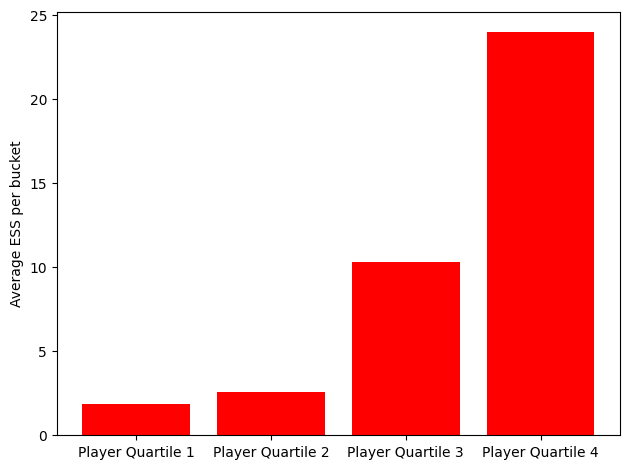

In [24]:
plot()